<a href="https://colab.research.google.com/github/sominshim/Predicting_Personality_through_Text/blob/somin/preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import tensorflow as tf
# !pip install tensorflow-hub
# !pip install tfds-nightly
import tensorflow_hub as hub
import tensorflow_datasets as tfds

print("버전: ", tf.__version__)
print("즉시 실행 모드: ", tf.executing_eagerly())
print("허브 버전: ", hub.__version__)
print("GPU", "사용 가능" if tf.config.experimental.list_physical_devices("GPU") else "사용 불가능")

버전:  2.4.0
즉시 실행 모드:  True
허브 버전:  0.10.0
GPU 사용 가능


In [3]:
# import module
import io
import pandas as pd

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.text import Tokenizer
from keras.models import Model
from keras.layers import LSTM, Activation, Dense, Dropout, Input, Embedding
from keras.optimizers import RMSprop
from keras.preprocessing import sequence
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
%matplotlib inline

np.random.seed(42)

In [4]:
from sklearn.feature_extraction.text import TfidfVectorizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer

from sklearn import model_selection
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [36]:
# pandas read_csv로 불러오기
data = pd.read_csv('/content/drive/My Drive/mbti_1.csv')
data2 = pd.read_csv("/content/drive/My Drive/mbti_crawling.csv")
df = pd.concat([data, data2], axis=0)
df.reset_index(inplace=True)
df.head()

,index,type,posts,Unnamed: 0
0,0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,NaN
1,1,ENTP,'I'm finding the lack of me in these posts ver...,NaN
2,2,INTP,'Good one _____ https://www.youtube.com/wat...,NaN
3,3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",NaN
4,4,ENTJ,'You're fired.|||That's another silly misconce...,NaN


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


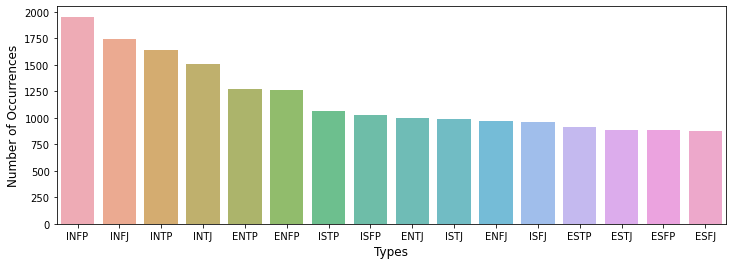

In [37]:
df.drop(['Unnamed: 0'], axis=1, inplace=True)
data = df.copy()
cnt_srs = data['type'].value_counts()

plt.figure(figsize=(12,4))
sns.barplot(cnt_srs.index, cnt_srs.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Types', fontsize=12)
plt.show()

In [38]:
# Split mbti personality into 4 letters and binarize
titles = ["Extraversion (E) - Introversion (I)",
          "Sensation (S) - INtuition (N)",
          "Thinking (T) - Feeling (F)",
          "Judgement (J) - Perception (P)"
         ] 
b_Pers = {'I':0, 'E':1, 'N':0, 'S':1, 'F':0, 'T':1, 'J':0, 'P':1}
b_Pers_list = [{0:'I', 1:'E'}, {0:'N', 1:'S'}, {0:'F', 1:'T'}, {0:'J', 1:'P'}]


#transform mbti to binary vector
def translate_personality(personality):
    return [b_Pers[l] for l in personality]

#transform binary vector to mbti personality
def translate_back(personality):
    s = ""
    for i, l in enumerate(personality):
        s += b_Pers_list[i][l]
    return s

list_personality_bin = np.array([translate_personality(p) for p in data.type])
print("Binarize MBTI list: \n%s" % list_personality_bin)

Binarize MBTI list: 
[[0 0 0 0]
 [1 0 1 1]
 [0 0 1 1]
 ...
 [1 0 0 1]
 [1 0 0 1]
 [1 0 0 1]]


In [39]:
data['I-E'] = list_personality_bin[:,0]
data['N-S'] = list_personality_bin[:,1]
data['F-T'] = list_personality_bin[:,2]
data['J-P'] = list_personality_bin[:,3]

In [40]:
data.head()

,index,type,posts,I-E,N-S,F-T,J-P
0,0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,0,0,0,0
1,1,ENTP,'I'm finding the lack of me in these posts ver...,1,0,1,1
2,2,INTP,'Good one _____ https://www.youtube.com/wat...,0,0,1,1
3,3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",0,0,1,0
4,4,ENTJ,'You're fired.|||That's another silly misconce...,1,0,1,0


## 데이터 전처리

In [11]:
from sklearn.preprocessing import LabelBinarizer
import string
from multiprocessing import Pool
import pandas as pd
import re
import time
import nltk
from nltk.corpus import stopwords

In [12]:
contraction_patterns = [ (r'won\'t', 'will not'), (r'can\'t', 'cannot'), (r'I\'m', 'I am'),(r'i\'m', 'i am'), (r'ain\'t', 'is not'), (r'(\w+)\'ll', '\g<1> will'), (r'(\w+)n\'t', '\g<1> not'),
                         (r'(\w+)\'ve', '\g<1> have'), (r'(\w+)\'s', '\g<1> is'), (r'(\w+)\'re', '\g<1> are'), (r'(\w+)\'d', '\g<1> would'), (r'&', 'and'), (r'dammit', 'damn it'), (r'dont', 'do not'), (r'wont', 'will not') ]
def replace(text):
    patterns = [(re.compile(regex), repl) for (regex, repl) in contraction_patterns]
    for (pattern, repl) in patterns:
        (text, count) = re.subn(pattern, repl, text)
    return text

In [94]:
def cleaner(post):
  # 영문자 이외 문자는 공백으로 변환  
  post = re.sub('[^a-zA-Z]', ' ', post)

  # 소문자 변환
  post = post.lower()
  
  # '|||' 제거
  post = post.replace('|||', "") 

  # URL, 링크 등 특수문자 제거
  post = re.sub(r'''(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:'".,<>?«»“”‘’]))''', '', post, flags=re.MULTILINE) 

  # 구두점 제거
  post = post.translate(str.maketrans('', '', string.punctuation))

  # 공백 제거
  post = re.sub( '\s+', ' ', post ).strip()

  # MBTI 제거
  post = re.sub('infj|entp|intp|intj|entj|enfj|infp|enfp|isfp|istp|isfj|istj|estp|esfp|estj|esfj',"", post)

  posts_split = post.split()
  # 불용어 제거
  # nltk.download('stopwords')
  stops = set(stopwords.words('english'))
  no_stops = [word for word in posts_split if not word in stops]

  # # 어간 추출
  stemmer = nltk.stem.SnowballStemmer('english')
  stemmer_words = [stemmer.stem(word) for word in no_stops]

  print(stemmer_words)

  # 길이가 짧은 단어 제거
  # shortword = re.compile(r'\W*\b\w{1,2}\b')
  # post = shortword.sub('', shortword)
  
  # return stemmer_words

In [14]:
# amend mispell
mispell_dict = {'colour': 'color', 'centre': 'center', 'favourite': 'favorite', 'travelling': 'traveling', 'counselling': 'counseling', 
                'theatre': 'theater', 'cancelled': 'canceled', 'labour': 'labor', 'organisation': 'organization', 'wwii': 'world war 2', 
                'citicise': 'criticize', 'youtu ': 'youtube ', 'Qoura': 'Quora', 'sallary': 'salary', 'Whta': 'What', 'narcisist': 'narcissist', 
                'howdo': 'how do', 'whatare': 'what are', 'howcan': 'how can', 'howmuch': 'how much', 'howmany': 'how many', 'whydo': 'why do', 
                'doI': 'do I', 'theBest': 'the best', 'howdoes': 'how does', 'mastrubation': 'masturbation', 'mastrubate': 'masturbate', 
                "mastrubating": 'masturbating', 'pennis': 'penis', 'Etherium': 'Ethereum', 'narcissit': 'narcissist', 'bigdata': 'big data', 
                '2k17': '2017', '2k18': '2018', 'qouta': 'quota', 'exboyfriend': 'ex boyfriend', 'airhostess': 'air hostess', "whst": 'what', 
                'watsapp': 'whatsapp', 'demonitisation': 'demonetization', 'demonitization': 'demonetization', 'demonetisation': 'demonetization', 'pokémon': 'pokemon'}
def correct_spelling(x, dic):
    for word in dic.keys():
        x = x.replace(word, dic[word])
    return x

In [76]:
def data_processing(data):

  text_replace = pd.DataFrame(columns=['TextBefore', 'TextAfter'])
  text_replace['TextBefore'] = data['posts'].copy()

  for index, row in text_replace.iterrows():
      row['TextAfter'] = replace(row['TextBefore'])

  # 특수문자 제거
  posts = text_replace.TextAfter.tolist()
  for i in range(len(posts)):
    data.loc[i, 'clean_post'] = cleaner(posts[i])
  
  # 오타 수정
  data['clean_post'] = data['clean_post'].apply(lambda x: correct_spelling(x, mispell_dict))
  
  print(stemmer_words)
  # # 공백으로 구분된 문자열로 결합하여 결과 반환
  # return ' '.join(stemmer_words)


In [41]:
text_replace = pd.DataFrame(columns=['TextBefore', 'TextAfter'])
text_replace['TextBefore'] = data['posts'].copy()

for index, row in text_replace.iterrows():
    row['TextAfter'] = replace(row['TextBefore'])

In [ ]:
posts = text_replace.TextAfter.tolist()
posts

In [51]:
len(posts)

18929

In [ ]:
for i in range(len(posts)):
  cleaner(posts[i])
  # data.loc[i, 'clean_post'] = cleaner(posts[i])

['http', 'www', 'youtub', 'com', 'watch', 'v', 'qsxhcwe', 'krw', 'http', 'media', 'tumblr', 'com', 'tumblr', 'lfouy', 'pma', 'qa', 'rooo', 'jpg', 'moment', 'https', 'www', 'youtub', 'com', 'watch', 'v', 'iz', 'le', 'g', 'xm', 'sportscent', 'top', 'ten', 'play', 'https', 'www', 'youtub', 'com', 'watch', 'v', 'ucdfz', 'etec', 'prank', 'life', 'chang', 'experi', 'life', 'http', 'www', 'youtub', 'com', 'watch', 'v', 'vxzeywwrdw', 'http', 'www', 'youtub', 'com', 'watch', 'v', 'u', 'ejam', 'dp', 'e', 'repeat', 'today', 'may', 'perc', 'experi', 'immers', 'last', 'thing', 'friend', 'post', 'facebook', 'commit', 'suicid', 'next', 'day', 'rest', 'peac', 'http', 'vimeo', 'com', 'hello', 'sorri', 'hear', 'distress', 'natur', 'relationship', 'perfect', 'time', 'everi', 'moment', 'exist', 'tri', 'figur', 'hard', 'time', 'time', 'growth', 'http', 'wallpaperpass', 'com', 'upload', 'friendship', 'boy', 'girl', 'wallpap', 'jpg', 'http', 'asset', 'dornob', 'com', 'wp', 'content', 'upload', 'round', 'home

In [93]:
data.head()

,index,type,posts,I-E,N-S,F-T,J-P,clean_post
0,0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,0,0,0,0,http www youtube com watch qsxhcwe krw http me...
1,1,ENTP,'I'm finding the lack of me in these posts ver...,1,0,1,1,finding the lack these posts very alarming se...
2,2,INTP,'Good one _____ https://www.youtube.com/wat...,0,0,1,1,good one https www youtube com watch fhigbolff...
3,3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",0,0,1,0,dear enjoyed our conversation the other day es...
4,4,ENTJ,'You're fired.|||That's another silly misconce...,1,0,1,0,you are fired that another silly misconception...


In [98]:
data.shape

(18929, 8)

In [97]:
data.to_csv('/content/drive/My Drive/mbti_processing.csv')

In [74]:
data['clean_post'] = data['clean_post'].apply(lambda x: correct_spelling(x, mispell_dict))
data

,index,type,posts,I-E,N-S,F-T,J-P,clean_post
0,0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,0,0,0,0,http www youtube com watch qsxhcwe krw http me...
1,1,ENTP,'I'm finding the lack of me in these posts ver...,1,0,1,1,finding the lack these posts very alarming se...
2,2,INTP,'Good one _____ https://www.youtube.com/wat...,0,0,1,1,good one https www youtube com watch fhigbolff...
3,3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",0,0,1,0,dear enjoyed our conversation the other day es...
4,4,ENTJ,'You're fired.|||That's another silly misconce...,1,0,1,0,you are fired that another silly misconception...
...,...,...,...,...,...,...,...,...
18924,10249,ENFP,I found this on discoveryourpersonality.com.\n...,1,0,0,1,found this discoveryourpersonality com here a...
18925,10250,ENFP,INFJ Workplace Strengths\n• are someone who re...,1,0,0,1,workplace strengths are someone who reaches u...
18926,10251,ENFP,"INFJ personality is idealistic, imaginative, v...",1,0,0,1,personality idealistic imaginative visionary ...
18927,10252,ENFP,"You're future-oriented, and direct your insigh...",1,0,0,1,you are future oriented and direct your insigh...


In [77]:
posts_split = data['clean_post'].split()

stops = set(stopwords.words('english'))
no_stops = [word for word in posts_split if not word in stops]
stemmer = nltk.stem.SnowballStemmer('english')
stemmer_words = [stemmer.stem(word) for word in no_stops]
stemmer_words

AttributeError: ignored

In [67]:
print(' '.join(stemmer_words))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [64]:
data['clean_post']=no_stops
data

,index,type,posts,I-E,N-S,F-T,J-P,clean_post
0,0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,0,0,0,0,http www youtube com watch v qsXHcwe krw ...
1,1,ENTP,'I'm finding the lack of me in these posts ver...,1,0,1,1,I am finding the lack of me in these posts ve...
2,2,INTP,'Good one _____ https://www.youtube.com/wat...,0,0,1,1,Good one https www youtube com wat...
3,3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",0,0,1,0,Dear INTP I enjoyed our conversation the o...
4,4,ENTJ,'You're fired.|||That's another silly misconce...,1,0,1,0,You are fired That is another silly miscon...
...,...,...,...,...,...,...,...,...
18924,10249,ENFP,I found this on discoveryourpersonality.com.\n...,1,0,0,1,I found this on discoveryourpersonality com ...
18925,10250,ENFP,INFJ Workplace Strengths\n• are someone who re...,1,0,0,1,INFJ Workplace Strengths are someone who rea...
18926,10251,ENFP,"INFJ personality is idealistic, imaginative, v...",1,0,0,1,INFJ personality is idealistic imaginative v...
18927,10252,ENFP,"You're future-oriented, and direct your insigh...",1,0,0,1,You are future oriented and direct your insig...


In [ ]:
data_processing(data)

In [71]:
data['clean_post']

0        capturing “concepts” with time management the ...
1        what happened our avatars thonow not the only ...
2         personality type from the myersbriggs jungian...
3        the protector  your primary mode living focuse...
4         workplace strengths • are someone who reaches...
                               ...                        
18924     profile “the peculiar nature introverted intu...
18925    first time posting forum since about years but...
18926     estimated between and percent the american po...
18927    sent from iphone using tapatalkwhen with peopl...
18928    you are futureoriented and direct your insight...
Name: clean_post, Length: 18929, dtype: object

In [73]:
post = re.sub('[^a-zA-Z]', ' ', data)
post

TypeError: ignored

In [63]:
# 멀티프로세싱 작업 
def use_multiprocess(func, iter, workers):
    pool = Pool(processes=workers)
    result = pool.map(func, iter)
    pool.close()
    return result

In [67]:
clean_processed_tweet = use_multiprocess(data_processing, data, 3)
# print('실행 시간 :', (time.time() - start_time))

Process ForkPoolWorker-13:
Process ForkPoolWorker-14:
Process ForkPoolWorker-15:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = get()
  File "/usr/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = g

KeyboardInterrupt: ignored

In [49]:
data.head()

,type,posts,I-E,N-S,F-T,J-P,clean_post
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,0,0,0,0,moment sportscent top ten play prankswhat life...
1,ENTP,'I'm finding the lack of me in these posts ver...,1,0,1,1,find lack post alarmingsex bore posit often ex...
2,INTP,'Good one _____ https://www.youtube.com/wat...,0,0,1,1,good one cours say know bless cursedo absolut ...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",0,0,1,0,dear enjoy convers day esoter gab natur univer...
4,ENTJ,'You're fired.|||That's another silly misconce...,1,0,1,0,firedthat anoth silli misconcept approach logi...


In [51]:
data = data.sample(frac=1).reset_index(drop=True)

# 토큰화

In [29]:
sentences = data['clean_post']
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)

In [30]:
encoded = tokenizer.texts_to_sequences(sentences)
print(encoded)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [31]:
max_len = max(len(item) for item in encoded)
print(max_len)

4512


## Train/ Test/ Validation data Split

In [52]:
categories = ['I-E', 'N-S', 'F-T', 'J-P']

train, test = train_test_split(data, random_state=42, test_size=0.2, shuffle=True)
X_train = train.clean_post
X_test = test.clean_post

print(X_train.shape)
print(X_test.shape)

(15143,)
(3786,)


성능측정 : 

균형 데이터 -> Accuracy
불균형 데이터 -> f1-score

In [53]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [54]:
test.head()

,type,posts,I-E,N-S,F-T,J-P,clean_post
1705,ESFJ,'Lol that's what I figured it meant but then I...,1,1,0,0,lol figur meant like wayi speak hindi well sup...
13740,ISTP,"INFJ Learning Style\n\nTo INFJs, learning is a...",0,1,1,1,learn style learn way expand horizon path towa...
11430,ENTP,"INFJ personality is idealistic, imaginative, v...",1,0,1,1,person idealist imagin visionari abstract name...
6921,ESFP,"INFJ personality is idealistic, imaginative, v...",1,1,0,1,person idealist imagin visionari abstract name...
3886,ESTP,Objective\nObjective functions orient around t...,1,1,1,1,object object function orient around “ object ...


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


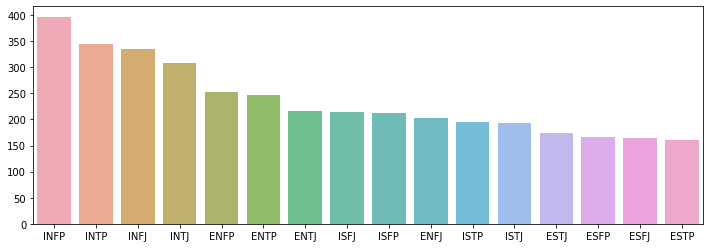

In [55]:
cnt_srs = test['type'].value_counts()

plt.figure(figsize=(12,4))
sns.barplot(cnt_srs.index, cnt_srs.values, alpha=0.8)

In [56]:
train.head()

,type,posts,I-E,N-S,F-T,J-P,clean_post
17415,ESTP,"INFJs, beneath an empathetic, reserved exterio...",1,1,1,1,beneath empathet reserv exterior deepli seriou...
6027,ENFJ,yeah its kinda odd but i like polite people|||...,1,0,0,0,yeah kinda odd like polit peopleread bookwhen ...
5140,INFP,'lol hey i'll take that as a compliment|||haha...,0,0,0,1,lol hey take complimenthaha girl life town cam...
1683,ESTP,The introverted intuitive perceives connection...,1,1,1,1,introvert intuit perceiv connect mean intern w...
10881,ENFJ,Main Characteristics\nINFJs focus on possibili...,1,0,0,0,main characterist focu possibl think term valu...


In [58]:
NB_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(max_features=200)),
                ('clf', OneVsRestClassifier(MultinomialNB(
                    fit_prior=True, class_prior=None))),
            ])
for category in categories:
    print('... Processing {}'.format(category))
    NB_pipeline.fit(X_train, train[category])
    prediction = NB_pipeline.predict(X_test)
    print('Test accuracy is {}'.format(f1_score(test[category], prediction)))

... Processing I-E
Test accuracy is 0.6412698412698413
... Processing N-S
Test accuracy is 0.6982707215265355
... Processing F-T
Test accuracy is 0.4875484228002213
... Processing J-P
Test accuracy is 0.5842405391394505


In [60]:
from sklearn.metrics import f1_score
SVC_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer()),
                ('clf', OneVsRestClassifier(LinearSVC(), n_jobs=1)),
            ])
for category in categories:
    print('... Processing {}'.format(category))
    SVC_pipeline.fit(X_train, train[category])
    prediction = SVC_pipeline.predict(X_test)
    print('Test accuracy is {}'.format(f1_score(test[category], prediction, average='micro')))

... Processing I-E
Test accuracy is 0.6732699418911781
... Processing N-S
Test accuracy is 0.7229265715795035
... Processing F-T
Test accuracy is 0.6275752773375595
... Processing J-P
Test accuracy is 0.6016904384574749


... Processing I-E
Test accuracy is 0.6764395139989435
[[1491  705]
 [ 520 1070]]
              precision    recall  f1-score   support

           0       0.74      0.68      0.71      2196
           1       0.60      0.67      0.64      1590

    accuracy                           0.68      3786
   macro avg       0.67      0.68      0.67      3786
weighted avg       0.68      0.68      0.68      3786



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

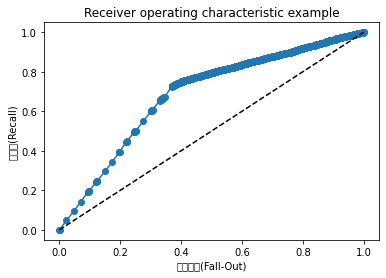

... Processing N-S
Test accuracy is 0.7287374537770734
[[1626  637]
 [ 390 1133]]
              precision    recall  f1-score   support

           0       0.81      0.72      0.76      2263
           1       0.64      0.74      0.69      1523

    accuracy                           0.73      3786
   macro avg       0.72      0.73      0.72      3786
weighted avg       0.74      0.73      0.73      3786



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

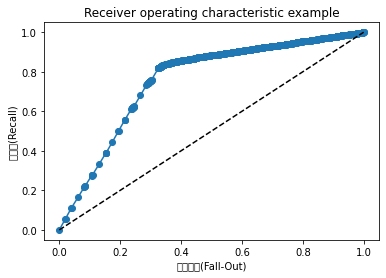

... Processing F-T
Test accuracy is 0.5287902799788695
[[1173  750]
 [1034  829]]
              precision    recall  f1-score   support

           0       0.53      0.61      0.57      1923
           1       0.53      0.44      0.48      1863

    accuracy                           0.53      3786
   macro avg       0.53      0.53      0.52      3786
weighted avg       0.53      0.53      0.53      3786



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

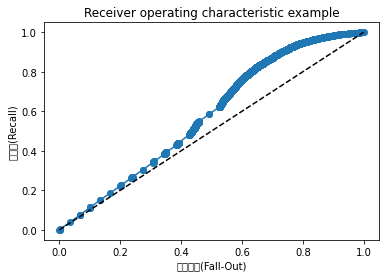

... Processing J-P
Test accuracy is 0.5504490227152667
[[ 926  830]
 [ 872 1158]]
              precision    recall  f1-score   support

           0       0.52      0.53      0.52      1756
           1       0.58      0.57      0.58      2030

    accuracy                           0.55      3786
   macro avg       0.55      0.55      0.55      3786
weighted avg       0.55      0.55      0.55      3786



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

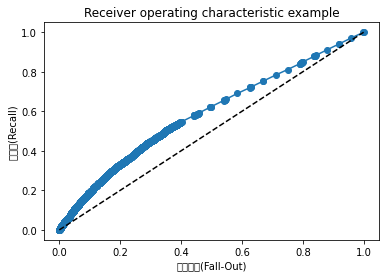

In [37]:
NB_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(max_features=100)),
                ('clf', OneVsRestClassifier(MultinomialNB(
                    fit_prior=True, class_prior=None))),
            ])
for category in categories:
    print('... Processing {}'.format(category))
    # X_train_over, y_train_over = smote.fit_sample(X_train, train[category])
    NB_pipeline.fit(X_train, train[category])
    prediction = NB_pipeline.predict(X_test)
    print('Test accuracy is {}'.format(accuracy_score(test[category], prediction)))
    print(confusion_matrix(test[category], prediction))
    # print(f1_score(test[category], prediction))
    print(classification_report(test[category], prediction, target_names=['0', '1']))

    from sklearn.metrics import roc_curve
    # test[category], prediction /X_train, train[category]
    fpr, tpr, thresholds = roc_curve(train[category], NB_pipeline.predict_proba(X_train)[:, 1])
    plt.plot(fpr, tpr, 'o-', label="Logistic Regression")
    plt.plot([0, 1], [0, 1], 'k--', label="random guess")
    # plt.plot([fallout], [recall], 'ro', ms=10)
    plt.xlabel('위양성률(Fall-Out)')
    plt.ylabel('재현률(Recall)')
    plt.title('Receiver operating characteristic example')
    plt.show()

... Processing I-E
Test accuracy is 0.6716851558372953
[[1351  845]
 [ 398 1192]]
              precision    recall  f1-score   support

           0       0.77      0.62      0.68      2196
           1       0.59      0.75      0.66      1590

    accuracy                           0.67      3786
   macro avg       0.68      0.68      0.67      3786
weighted avg       0.69      0.67      0.67      3786



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

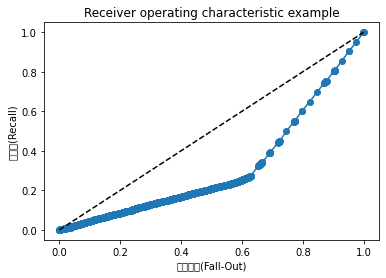

... Processing N-S
Test accuracy is 0.7303222398309561
[[1562  701]
 [ 320 1203]]
              precision    recall  f1-score   support

           0       0.83      0.69      0.75      2263
           1       0.63      0.79      0.70      1523

    accuracy                           0.73      3786
   macro avg       0.73      0.74      0.73      3786
weighted avg       0.75      0.73      0.73      3786



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

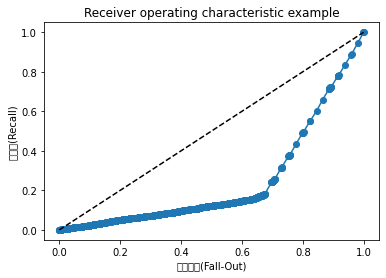

... Processing F-T
Test accuracy is 0.6354992076069731
[[ 850 1073]
 [ 307 1556]]
              precision    recall  f1-score   support

           0       0.73      0.44      0.55      1923
           1       0.59      0.84      0.69      1863

    accuracy                           0.64      3786
   macro avg       0.66      0.64      0.62      3786
weighted avg       0.66      0.64      0.62      3786



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

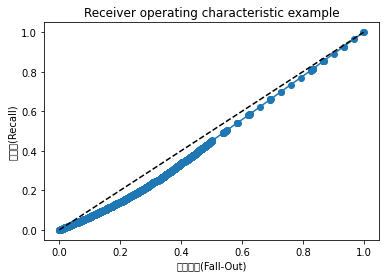

... Processing J-P
Test accuracy is 0.5750132065504491
[[1297  459]
 [1150  880]]
              precision    recall  f1-score   support

           0       0.53      0.74      0.62      1756
           1       0.66      0.43      0.52      2030

    accuracy                           0.58      3786
   macro avg       0.59      0.59      0.57      3786
weighted avg       0.60      0.58      0.57      3786



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

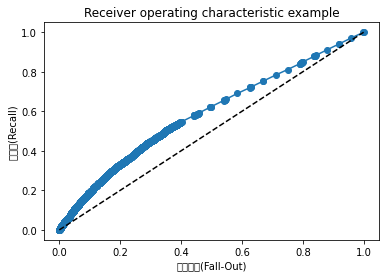

In [38]:
SVC_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer()),
                ('clf', OneVsRestClassifier(LinearSVC(), n_jobs=1))
])
for category in categories:
    print('... Processing {}'.format(category))
    SVC_pipeline.fit(X_train, train[category])
    prediction = SVC_pipeline.predict(X_test)
    print('Test accuracy is {}'.format(accuracy_score(test[category], prediction)))
    print(confusion_matrix(test[category], prediction))
    # print(f1_score(test[category], prediction))
    print(classification_report(test[category], prediction, target_names=['0', '1']))
    from sklearn.metrics import roc_curve
    # test[category], prediction /X_train, train[category]
    fpr, tpr, thresholds = roc_curve(train[category], NB_pipeline.predict_proba(X_train)[:, 1])
    plt.plot(fpr, tpr, 'o-', label="Logistic Regression")
    plt.plot([0, 1], [0, 1], 'k--', label="random guess")
    # plt.plot([fallout], [recall], 'ro', ms=10)
    plt.xlabel('위양성률(Fall-Out)')
    plt.ylabel('재현률(Recall)')
    plt.title('Receiver operating characteristic example')
    plt.show()

... Processing I-E
Test accuracy is 0.7780979827089337
[[1326   27]
 [ 358   24]]
              precision    recall  f1-score   support

           0       0.79      0.98      0.87      1353
           1       0.47      0.06      0.11       382

    accuracy                           0.78      1735
   macro avg       0.63      0.52      0.49      1735
weighted avg       0.72      0.78      0.71      1735



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

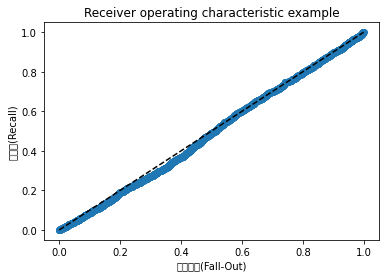

... Processing N-S
Test accuracy is 0.8570605187319885
[[1486    3]
 [ 245    1]]
              precision    recall  f1-score   support

           0       0.86      1.00      0.92      1489
           1       0.25      0.00      0.01       246

    accuracy                           0.86      1735
   macro avg       0.55      0.50      0.47      1735
weighted avg       0.77      0.86      0.79      1735



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

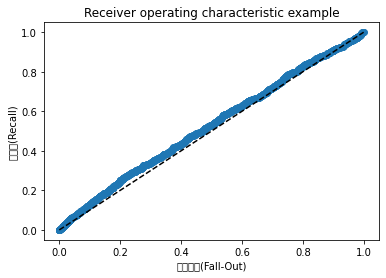

... Processing F-T
Test accuracy is 0.7170028818443804
[[709 228]
 [263 535]]
              precision    recall  f1-score   support

           0       0.73      0.76      0.74       937
           1       0.70      0.67      0.69       798

    accuracy                           0.72      1735
   macro avg       0.72      0.71      0.71      1735
weighted avg       0.72      0.72      0.72      1735



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

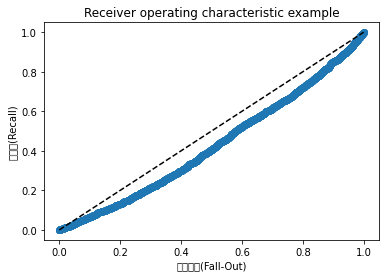

... Processing J-P
Test accuracy is 0.6236311239193083
[[192 477]
 [176 890]]
              precision    recall  f1-score   support

           0       0.52      0.29      0.37       669
           1       0.65      0.83      0.73      1066

    accuracy                           0.62      1735
   macro avg       0.59      0.56      0.55      1735
weighted avg       0.60      0.62      0.59      1735



/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50948 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49457 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 47456 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54788 missing from current font.
  font.set_

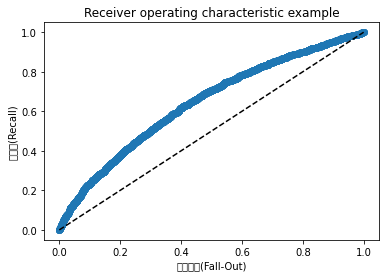

In [ ]:
LogReg_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(max_features=200)),
                ('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=1)),
            ])
for category in categories:
    print('... Processing {}'.format(category))
    LogReg_pipeline.fit(X_train, train[category])
    prediction = LogReg_pipeline.predict(X_test)
    print('Test accuracy is {}'.format(accuracy_score(test[category], prediction)))
    print(confusion_matrix(test[category], prediction))
    # print(f1_score(test[category], prediction))
    print(classification_report(test[category], prediction, target_names=['0', '1']))
    from sklearn.metrics import roc_curve
    # test[category], prediction /X_train, train[category]
    fpr, tpr, thresholds = roc_curve(train[category], NB_pipeline.predict_proba(X_train)[:, 1])
    plt.plot(fpr, tpr, 'o-', label="Logistic Regression")
    plt.plot([0, 1], [0, 1], 'k--', label="random guess")
    # plt.plot([fallout], [recall], 'ro', ms=10)
    plt.xlabel('위양성률(Fall-Out)')
    plt.ylabel('재현률(Recall)')
    plt.title('Receiver operating characteristic example')
    plt.show()

In [ ]:
somin_text=[" I am studying computer programming and statistics at Sejong University to become a big data analyst (data scientist). Since the department was newly established in 2017, there is no established curriculum and there is no seniors. In addition, there are many times when we do not know how to study. However, during my three semesters I had a certain sense of enlightenment. I want to become as data scientist by studying my magor and I have to be proficient in English to achieve my dream. When I attended a seminar at NC-soft Company, I wanted to work in a foreign country. I have heard that Korea's data scientists do not have their own roles and are doing various things in various fields. It is because big data field did not develop in Korea. And beacause of the ‘protection law’ on personal information leakage, I think that this field will not grow under the policy of Korea, which can not even collect data, which is the most basic step of data analysis. So I decided to go abroad to become a real data scientist. I also made the same commitment when I took an introduction to data analysis in English. When I did not know the concept, I studied with internet search, and all the materials and Youtube lectures were in English. So I had difficulty taking this course. Through this, I once again felt the need for English. I spent two years studying at school and thought that English should be the foundation for me to learn my major deeply and surely. So I decided that I would become more familiar with English through exchange students and would be very helpful for future foreign entry. There are two reasons to go to the The Hague University of Applied Sciences in the Netherlands through the exchange student program. One of that the English level of the European countries 2-3 ranking well. Statistically, Dutch people overestimate their English skills. They have a high level of confidence in English and think that I can not speak English perfectly because I am a foreigner. It is the opposite of Korea, which it is better not to say it because of poor pronunciation or lack of confidence in English ability. In this free environment, I want to assimilate with the Dutch and increase my confidence in English. The other reason is that there is a curriculum that allows students to experience their majors in practice. Taking the APPLIED DATA SCIENCE HBO-ICT course at The Hague University, a team of 6-8 students and an experienced data scientist conducts a project on data science research for half the semester. The other half is about learning about data science, machine learning, Python laptops, and so on. This curriculum has become very attractive. The job of DataScientist is promising, but I always wondered what it does in practice because of lack of relevant information and history. However, if I complete the APPLIED DATA SCIENCE HBO-ICT curriculum, which can not be done at Sejong University, I can solve my questions and dreams will become concrete. For this reason, I would like to be selected for the exchange student program at the The Hague University of Applied Sciences in the Netherlands and to be proud of the school."]

In [ ]:
for category in categories:
    print('... Processing {}'.format(category))
    # X_train_over, y_train_over = smote.fit_sample(X_train, train[category])
    NB_pipeline.fit(X_train, train[category])
    prediction = NB_pipeline.predict(X_test)